# Bayesian inference

## [Models in Population Biology](http://modelspopbiol.yoavram.com)
## Yoav Ram

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats
import scipy.optimize
import numba
import seaborn as sns
sns.set_context('talk')

import warnings
from numba import NumbaDeprecationWarning
warnings.simplefilter('ignore', NumbaDeprecationWarning)

red, blue, green = sns.color_palette('Set1', 3)

In the previous lecture we discusses the frequentist approach to statistical inference using maximum likelihood.
Today we will discuss the Bayesian approach.

Bayesian inference is a method of statistical inference in which Bayes' theorem is used to update the probability for a hypothesis as more evidence or information becomes available. 

# Bayes' theorem
Consider the events $A$ and $B$, then Bayes' theorem states that

$$
P(A \mid B) = \frac{P(B \mid A) P(A)}{P(B)}
$$

Applied to model-based inference, we define:
- $\theta$ - the model parameters
- $X$ - the data
and we have

$$
P(\theta \mid X) = \frac{P(X \mid \theta) P(\theta)}{P(X)}
$$
where
- $P(\theta)$ is called the **prior probability** that formulates our beliefs about the model before seeing any data
- $P(X \mid \theta)$ is the probability of observing $X$ given $\theta$, what we called the **likelihood** of $\theta$
- $P(\theta \mid X)$ is called the **posterior probability**, that is, how our beliefs about the model changed due to observing the data
- $P(X)$ is the probability of observing the data unconditioned on the model; we usually ignore it as it does not depend on the model

In Bayesian inference we attempt to estimate the posterior distribution over the model parameters; this constrast with classical/frequentist approaches like *maximum likelihood* in which we attempt to estimate a point estimate of the parameters - a single parameter value.

# Poisson model for count data

This example follows a [blog post by Jake VanDerPlas](http://jakevdp.github.io/blog/2014/03/11/frequentism-and-bayesianism-a-practical-intro/).

Imagine that we count the number of [European red mites](https://en.wikipedia.org/wiki/Panonychus_ulmi) on apple leaves.

Denote the number of leaves by $n$, where the $i^{\rm th}$ measurement $X_i$ reports the observed number of mites on leaf $i$.
We assume that $X_i$ is Poisson-distributed around the expected number of mites $\mu$, 
$$
X_i \sim Poi(\mu)
$$

So $Poi(\mu)$ is our **model**, and $\{X_i\}$ is the data.

The question is, given this data $\{X_i\}$, what is our best estimate of $\mu$? 
And the next question would be: does the model provide a good fit to the data?

Generating this estimate is the objective of **statistical inference**: making conclusions on observable phenomea by applying mathematical methods to data and models.

## Synthetic data from Poisson model

We start by simulating data before using real data.

In [2]:
rng = np.random.default_rng(1202)

# expected number of mites on a leaf
μ = 10  
# number of measurements
n = 50 
# n measurements of the mites
X = rng.poisson(μ, size=n)

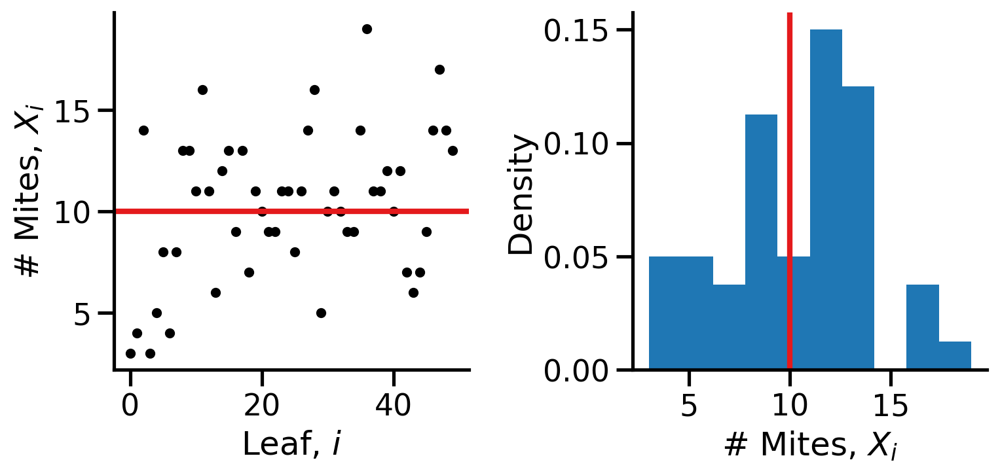

In [3]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

ax = axes[0]
ax.plot(np.arange(n), X, '.k')
ax.axhline(μ, linewidth=3, color=red)
ax.set_xlabel("Leaf, $i$")
ax.set_ylabel("# Mites, $X_i$")

ax = axes[1]
ax.hist(X, bins=10, density=True)
ax.axvline(μ, linewidth=3, alpha=1, color=red)
ax.set_ylabel("Density")
ax.set_xlabel("# Mites, $X_i$")

fig.tight_layout()
sns.despine()

In this toy example we already know the
true value of $\mu$, but the question is this: **given our measurements $\{X_i\}$, what is our best estimate of the true $\mu$?**

We have previously developed the log-likelihood function:

In [4]:
@np.vectorize(excluded=(1,))
def log_likelihood(μ, X):
     return scipy.stats.poisson(μ).logpmf(X).sum()

And we found that the maximum likelihood estimate $\hat{\mu}$ is the _arithmetic mean_.

μ = 10 
μ_hat = 10.2600


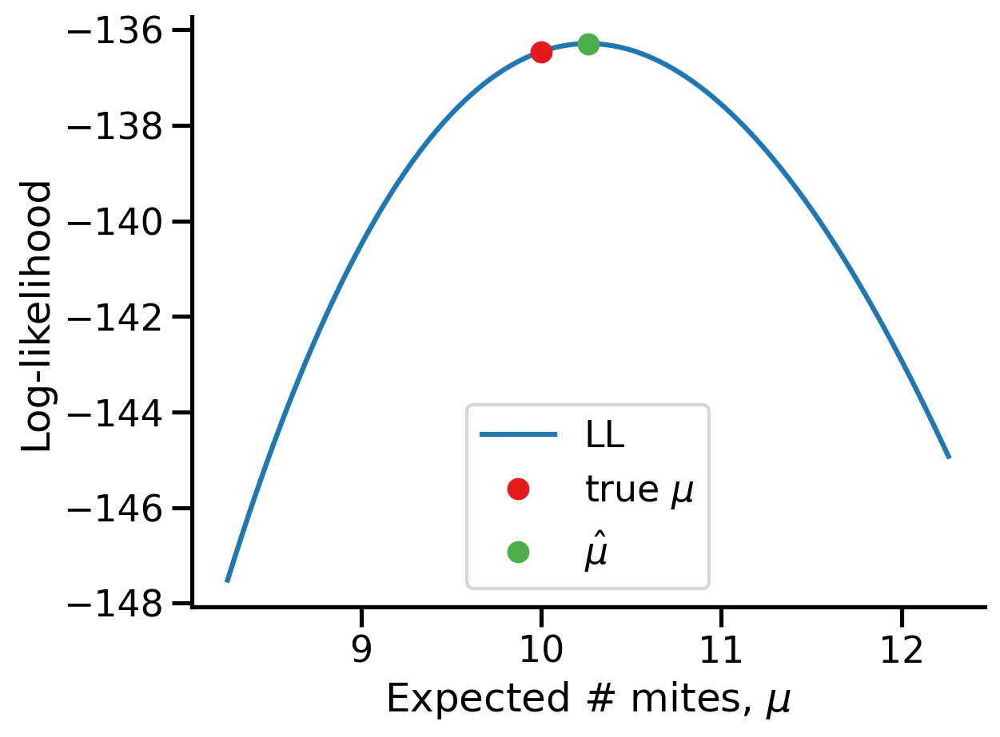

In [29]:
μ_hat = X.mean()
print("μ = {} \nμ_hat = {:.4f}".format(μ, μ_hat))

X_range = np.linspace(μ_hat-2, μ_hat+2, 1000)
plt.plot(X_range, log_likelihood(X_range, X), label='LL')
plt.plot(μ, log_likelihood(μ, X), 'o', color=red, label='true $μ$')
plt.plot(μ_hat, log_likelihood(μ_hat, X), 'o', color=green, label='$\hat{μ}$')

plt.xlabel("Expected # mites, $\mu$")
plt.ylabel("Log-likelihood")
plt.legend()
sns.despine()

## Bayesian inference with direct computation

In the Bayesian approach, we want to compute the  posterior distribution of the model parameter
$$
P(\mu \mid X) = \frac{P(X \mid \mu) P(\mu)}{P(X)},
$$
which reflects our knowledge or beliefe on the parameter $\mu$.

This is important: we actually want to form a belief (or opinion) on any value of the $\mu$ parameter (which is expressed by the posterior probability $P(\mu \mid X)$), rather than just choosing the value that fits best to the data (which is what maximum likelihood does)

We can't compute $P(X)$, but given a definition of the prior $P(\mu)$ and likelihood $P(X \mid \mu)$ we can compute the posterior $P(\mu \mid X)$ for any $\mu$ up to a constant -- that constant is $P(X)$.
So if we then normalize we can get the posterior.

Let's assume the prior is uniform in the positive values:

$$
P(\mu = u) = \begin{cases}
1, & u > 0 \\
0, & \text{otherwise}
\end{cases}
$$


Therefore the log-prior is:

$$
logP(\mu = x) = \begin{cases}
0, & x > 0 \\
-\infty, & \text{otherwise}
\end{cases}
$$

We already have a definition for the log-likelihood in the form of the above `log_likelihood` function, which computes:
$$
logP(\mu \mid X) = \log\mathcal{L}(\mu |X) + \log{P(\mu)} = 
\sum_{i=1}^{n}{X_i \log{\mu} -\mu -\log{(X_i!)}} + 0
$$
where $X_i$ ($1 \le i \le n$) are the data points in $X$ and $\mu>0$.

In [14]:
@np.vectorize
def log_prior(μ):
    return 0

@np.vectorize(excluded=(1,))
def log_posterior(μ, X):
    return log_prior(μ) + log_likelihood(μ, X)

This is a one-dimensional problem, so we can work with a direct approach; that won't work with multi-dimensional problems, and therefore it is common to use sampling methods such as _Markov chain Monte Carlo_, or _MCMC_.

Let's do it anyway.
Since we can't compute for every positive $\mu$ lets just do it for $min(X) < \mu < max(X)$, as we can assume the posterior probability is very small for $\mu$ values that outside the range of the data.

Our point estimate will be the maximum of the posterior (i.e. _MAP_), rather than that of the likelihood (although there is not differene in this case because of the uniform prior).

In [31]:
μ_range = np.linspace(μ_hat-2, μ_hat+2, 1000)
pri = np.exp(log_prior(μ_range))
lik = np.exp(log_likelihood(μ_range, X))
post = np.exp(log_posterior(μ_range, X))
μ_hat = μ_range[post.argmax()] # maximum a posterioi estimate
print("μ = {} \nμ_hat = {:.4f}".format(μ, μ_hat))

μ = 10 
μ_hat = 10.2620


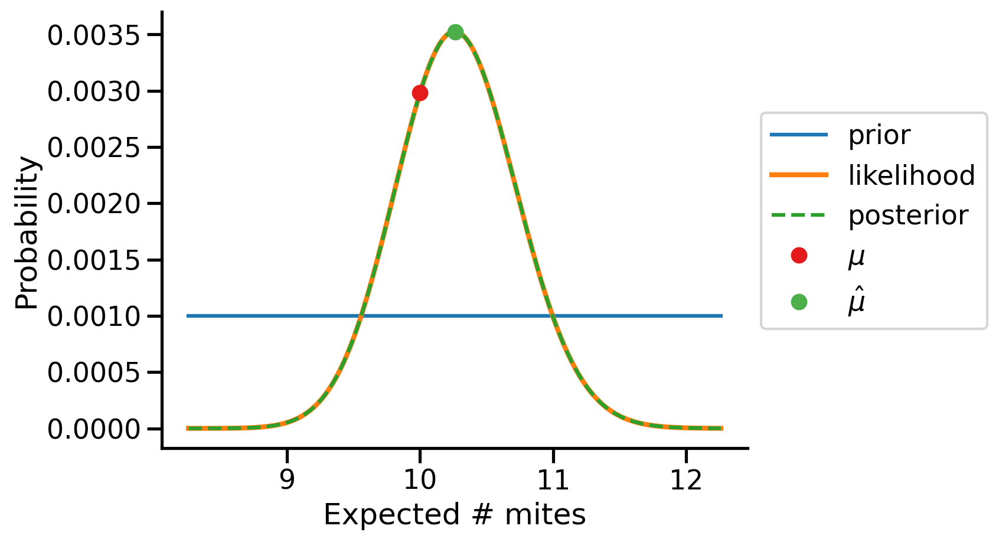

In [32]:
plt.plot(μ_range, pri/pri.sum(), label='prior')
plt.plot(μ_range, lik/lik.sum(), lw=3, label='likelihood')
plt.plot(μ_range, post/post.sum(), ls='--', label='posterior')
plt.plot(μ, np.exp(log_posterior(μ, X))/post.sum(), 'o', color=red, label='$μ$')
plt.plot(μ_hat, np.exp(log_likelihood(μ_hat, X))/lik.sum(), 'o', color=green, label='$\hat{μ}$')

plt.xlabel("Expected # mites")
plt.ylabel("Probability")
plt.legend(bbox_to_anchor=(1, 0.8))
sns.despine()

Let's change the prior to something more informative: say we think the number of mites on a leaf should be $9 \pm 2$, because of some previous study. We can then use an informative prior distribution,
$$
\mu \sim N(\mu=9, \sigma=2)
$$
Now we can plot the prior, likelihood, and posterior again.

In [33]:
@np.vectorize
def log_prior(μ):
    return scipy.stats.norm(loc=9, scale=2).logpdf(μ)

μ = 10 
μ_hat = 10.1919


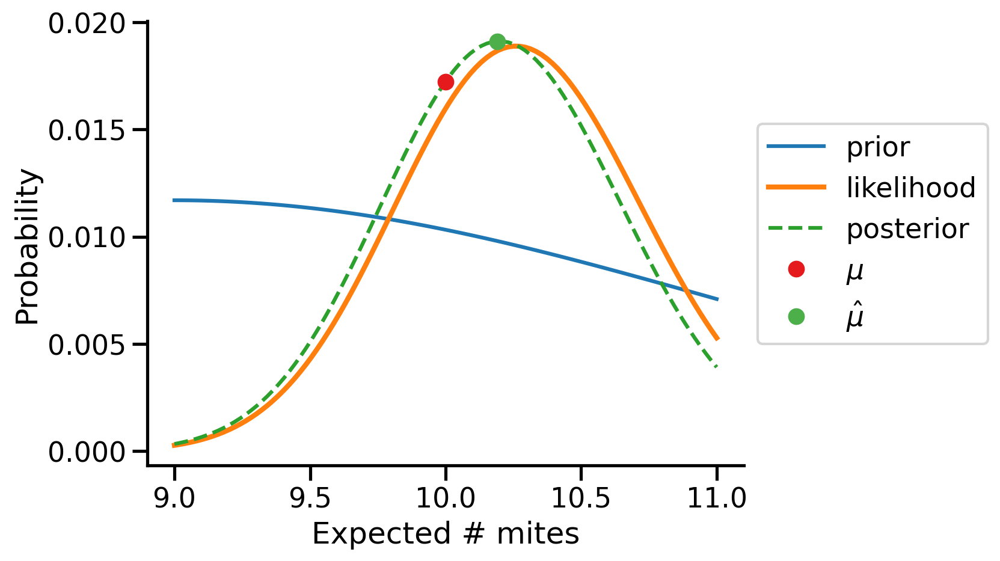

In [34]:
μ_range = np.linspace(9, 11, 100)
pri = np.exp(log_prior(μ_range))
lik = np.exp(log_likelihood(μ_range, X))
post = np.exp(log_posterior(μ_range, X))
μ_hat = μ_range[post.argmax()] # maximum a posterioi estimate
print("μ = {} \nμ_hat = {:.4f}".format(μ, μ_hat))

plt.plot(μ_range, pri/pri.sum(), label='prior')
plt.plot(μ_range, lik/lik.sum(), lw=3, label='likelihood')
plt.plot(μ_range, post/post.sum(), ls='--', label='posterior')
plt.plot(μ, np.exp(log_posterior(μ, X))/post.sum(), 'o', color=red, label='$μ$')
plt.plot(μ_hat, np.exp(log_posterior(μ_hat, X))/post.sum(), 'o', color=green, label='$\hat{μ}$')

plt.xlabel("Expected # mites")
plt.ylabel("Probability")
# plt.yscale('log')
# plt.ylim(1e-7, 1)
plt.legend(bbox_to_anchor=(1, 0.8))
sns.despine()

# Monte Carlo: Sampling instead of computing

For anything that has more than one or two parameters we cannot do the above exhustive method as the complexity increases with the number of parameters (or the dimension of the parameter space).

A common approach is therefore to use *Monte Carlo* or sampling methods. 
With Monte Carlo, instead of directly computing the posterior distribution, we indirectly sample from the posterior distribution.

**Note**: this is an important shift in our methodology. **Instead of computing, we sample**. That is, instead of finding the function $P(\mu \mid X)$, we want to find a set of $m$ samples from the posterior $\{\mu_i\}$ such that $P(\mu_i = u) = P(\mu=u \mid X)$.

Monte Carlo methods are used in a variety of applications other then posterior sampling.

For example, we will compute $\pi$ by estimating the area of a quarter of the unit circle (a circle with radius 1), which has an area of $\pi/4$.

The unit circle is defined by the curve $x^2 + y^2 = 1$.

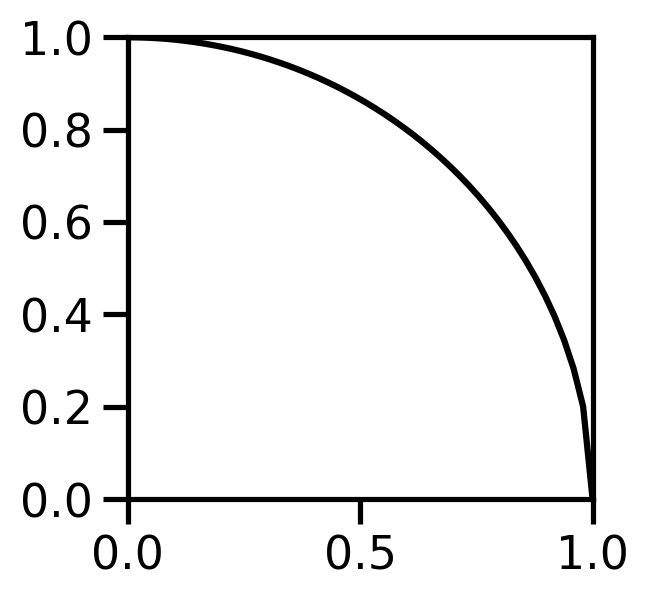

In [47]:
x = np.linspace(0, 1)
y = (1 - x*x)**0.5

plt.figure(figsize=(3,3))
plt.plot(x, y, '-k')
plt.xlim(0, 1)
plt.ylim(0, 1);

If we wish to compute the integral $\int_0^1{\sqrt{1-x^2} \; dx}$, we can draw random points in the unit square and compute the fraction of points below the curve.
This would approximate the integral value, which is the area of a quarter of the unit circle, which should equal $\pi/4$.

π estimate:	 3.1344
π:		 3.141592653589793


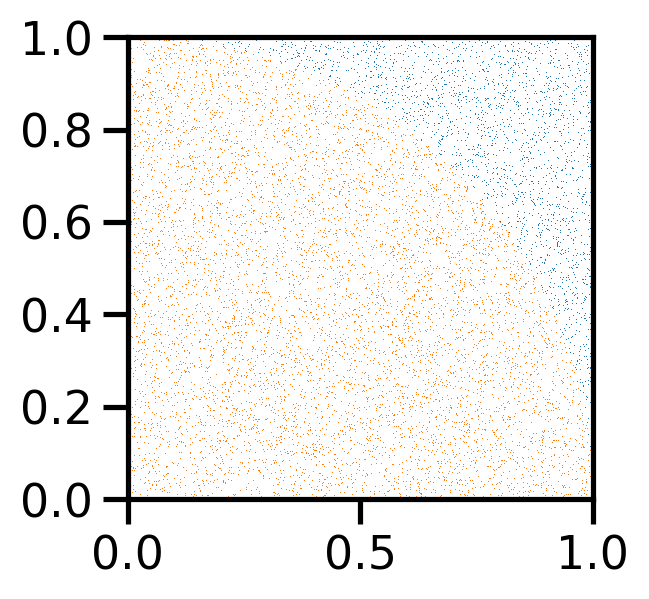

In [57]:
N = 10000
x, y = rng.random((2, N))
accepted = y < (1-x*x)**0.5
print('π estimate:\t', 4*accepted.mean())
print('π:\t\t', np.pi)

plt.figure(figsize=(3,3))
plt.plot(x[~accepted], y[~accepted], ',')
plt.plot(x[accepted], y[accepted], ',')
plt.xlim(0, 1)
plt.ylim(0, 1);

This method of sampling is called __rejection sampling__ and we can employ if for sampling from the posterior distribution (instead of the area below `f(x)`.

## Rejection sampling

Given empirical data $X$, a model parameterized by the vector $\theta$, a prior $P(\theta)$, and likelihood $P(X \mid \theta)$, the following describes the *rejection sampling algorithm*:

1. Generate candidate parameter value from the prior $\theta^* \sim P(\theta)$  
1. Compute the likelihood for the candidate parameter $P(X \mid \theta^*)$
1. Accept $\theta^*$ with probability proportional to $P(X \mid \theta^*)$.

This process effectivelty samples from the posterior, as the probability to draw $\theta^*$ proportinal to $P(X \mid \theta^*) P(\theta^*)$. 

Therefore, the collection of accepted $\theta^*$ values _approximates_ the posterior distribution $P(\theta \mid x)$.

The proportion of accepted values is caleld the __acceptance rate__, and it can be very low if the prior is very different from the posterior (which frequently occurs if we don't know much about the parameter values). For example, if we run the following with a "flat" (uniform) prior, we will get an acceptance rate of about 1:100,000.
With an informative prior - a Gaussian around the mean of the data - we still only have an acceptance rate of about 1:10,000.

So we have to take at least 100,000 samples, and the running time is therefore long.

In [52]:
N = 10000
# sample from prior
prior = scipy.stats.norm(9, 2)
μs = prior.rvs(N) 
# accept or reject according to likelihood/prior
log_liks = log_likelihood(μs, X) # compute log-likelihood
liks = np.exp(log_liks) # exponentiate to get likelihood
liks /= liks.sum() # normalize
liks /= prior.pdf(μs) # divide by prior

randoms = np.random.random(N) # draw randoms
accepted = randoms < liks # accept or reject
accept_rate = accepted.mean()
print("Acceptance rate: ", accept_rate)

Acceptance rate:  0.0008


In [53]:
μ_hat = μs[accepted].mean()
print("μ = {} \nμ_hat = {:.4f}".format(μ, μ_hat))

μ = 10 
μ_hat = 10.3203


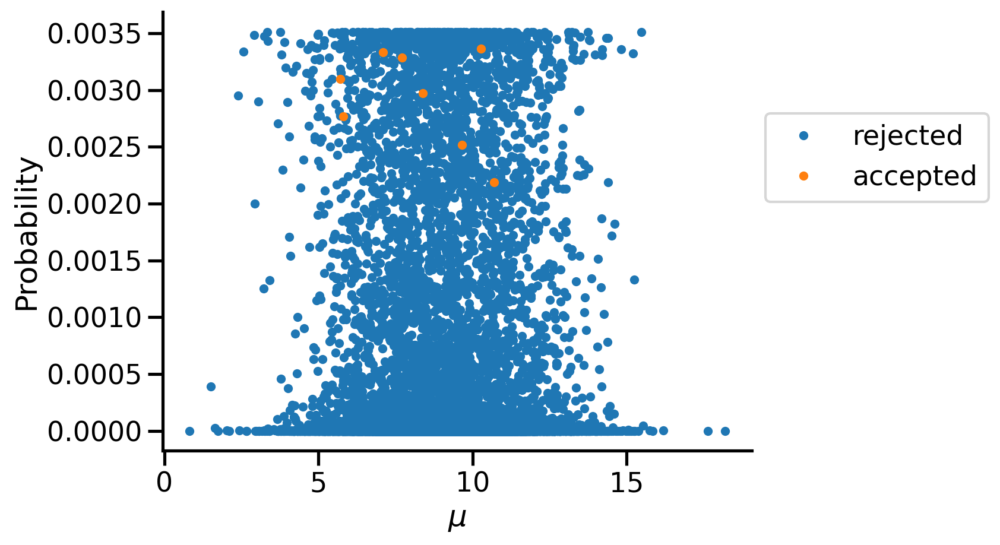

In [55]:
μs.sort()
plt.plot(μs[~accepted], liks[~accepted], '.', label='rejected')
plt.plot(μs[accepted], liks[accepted], '.', label='accepted')
plt.legend(bbox_to_anchor=(1, 0.8))
plt.xlabel('$\mu$')
plt.ylabel('Probability')
sns.despine()

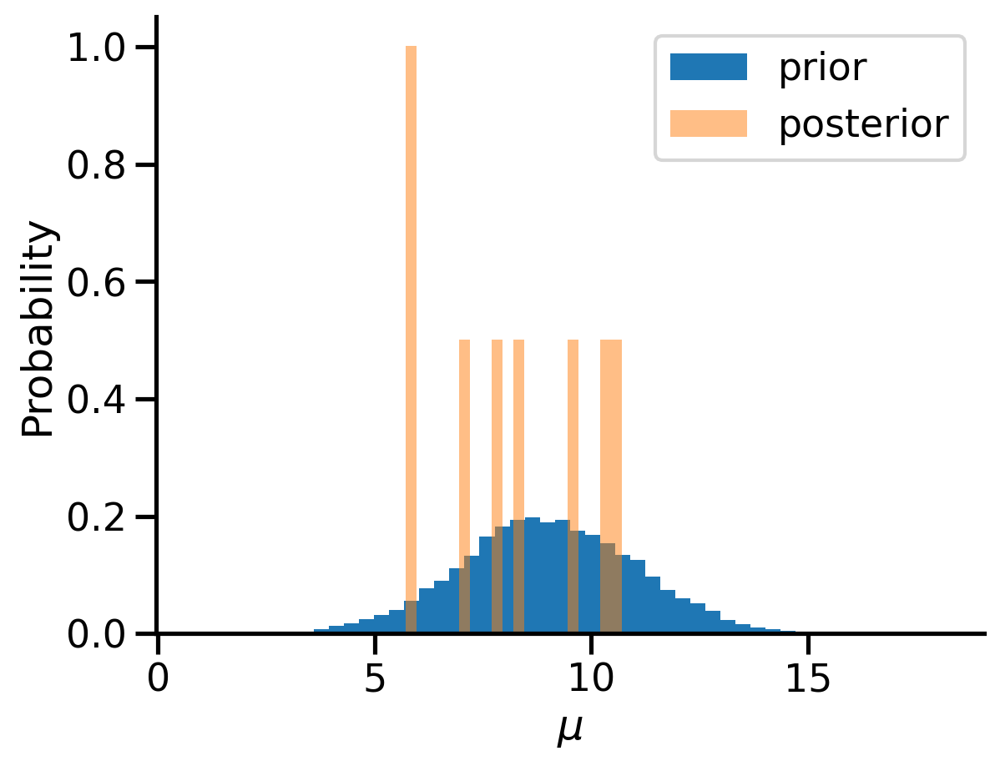

In [56]:
plt.hist(μs, bins=50, density=True, label='prior')
plt.hist(μs[accepted], bins=20, density=True, alpha=0.5, label='posterior')
plt.legend()
plt.xlabel('$\mu$')
plt.ylabel('Probability')
sns.despine()

The problem with the rejection method is that the acceptance rate can be very low, which requires us to draw many samples from the prior, and compute the log-likelihood many times, and this is very wasteful.

We deal with the low acceptance rate is in the next section.

## Markov chain Monte Carlo: MCMC

Markov chain Monte Carlo is a family of clever algorithms for sampling with the prior with a much higher acceptance rate by concentrating on the areas of high likelihood.

We create "chains" of accepted parameter samples of length $N$ using the following algorithm.

The most well-known, maybe, of these algorithms is the **Metropolis–Hastings** algorithm.

At iteration $i$, given the previous parameter value $\theta_i$, we
1. Generate a candidate parameter value $\theta^*$ from a proposal distribution $\theta^* \sim N(\theta_i, \eta)$.
1. Compute the likelihood $P(X \mid \theta^*)$.
1. Set the acceptance probability $\alpha = \frac{P(\theta^* \mid X)}{P(\theta_i \mid X)} = \frac{P(X \mid \theta^*)P(\theta^*)}{P(X \mid \theta_i)P(\theta_i)}$ to the ratio of posterior probabilities.
1. Set $\theta_{i+1} = \theta^*$ with probability $min(1,\alpha)$ (i.e. accept $\theta^*$), otherwise set $\theta_{i+1} = \theta_i$ (i.e. reject $\theta^*$ and keep $\theta_i$ again).

_Note:_
in the more general case, we can use a proposal distribution $q(\theta \mid \theta_i)$ and then we set $\alpha = \frac{P(X \mid \theta^*) q(\theta_i \mid \theta^*)}{P(X \mid \theta_i) q(\theta^* \mid \theta_i)}$. If we use the gaussian proposal distribution, then it is symmetric around the mean $q(\theta_i \mid \theta^*) = q(\theta^* \mid \theta_i)$, and $\alpha$ simplifies.

This sampling algorithm is much more efficient than the rejection sampling, as it is able to "spend more time" in areas of high likelihood.

However, this algorithm can get stuck on areas of low likelihood.

In [58]:
η = 0.5 # proposal width, exploration rate
N = 10000 # chain length
burnin = N // 2 # the first 50% of samples are removed, used only to get closer to the real value
accept = 0

μ_samples = np.empty(N)
μ_samples[0] = rng.uniform(X.min(), X.max()) # initial guess 
logposterior = log_likelihood(μ_samples[0], X) + log_prior(μ_samples[0])

# prepare random numbers for efficient sampling of N samples at a time
proposals = rng.normal(0, η, size=N)
loguniforms = np.log(rng.random(size=N))
logposteriors = np.zeros(N)

# start the chain
for i in range(1, N):
    # generate candidate
    μ_candidate = μ_samples[i-1] + proposals[i]
    # compute log-posterior
    logposterior_candidate = log_likelihood(μ_candidate, X) + log_prior(μ_candidate)
    # compute acceptance log-probability
    logα = logposterior_candidate - logposterior # = log(P(θ* | X) / P(θi | X))
    # accept / reject
    if logα > loguniforms[i]: # uniform is lower than α with probability α 
        logposterior = logposterior_candidate
        μ_samples[i] = μ_candidate
        accept += 1
    else: # reject
        μ_samples[i] = μ_samples[i-1]
    logposteriors[i] = logposterior
         
accept_rate = accept / N
print("Acceptance rate:", accept_rate)

Acceptance rate: 0.673


We can see that the acceptance rate is much higher.

Lets look at the chain using a **trace plot**. It shows the sample values over time, and we would like to make sure that after the burnin time (represented here in shaded area) the chain has "stabilized": it fluctuates, but it no longer has a trend.

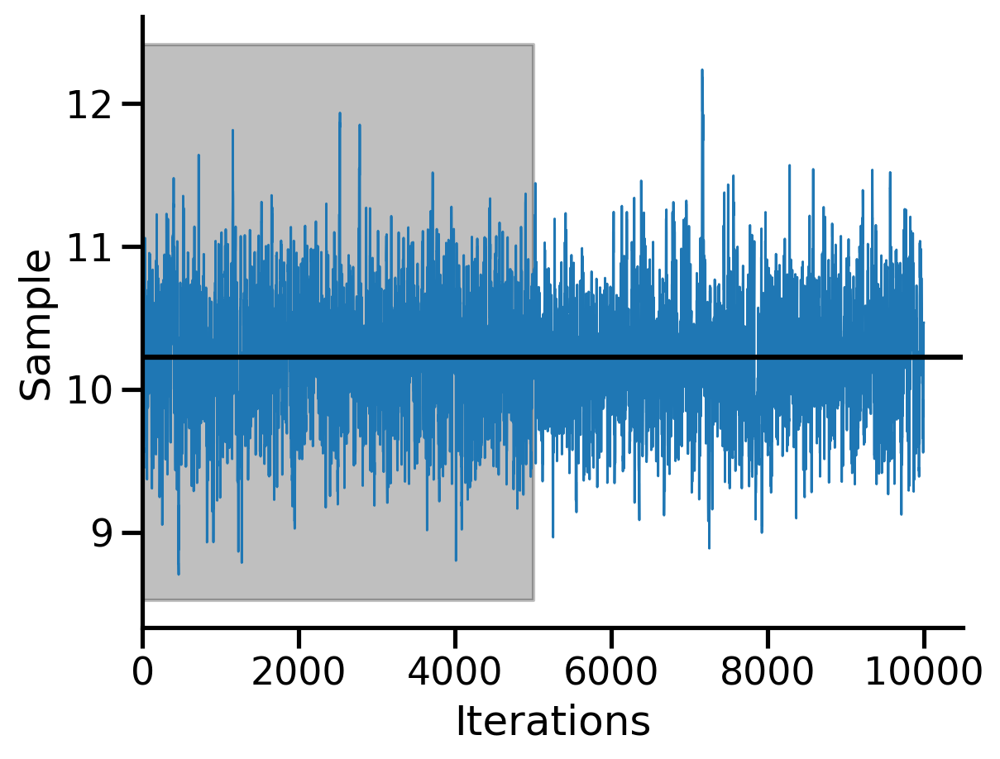

In [59]:
plt.plot(μ_samples, lw=1)
plt.axhline(μ_samples[burnin:].mean(), color='k')
plt.fill_betweenx(plt.ylim(), 0, burnin, color='k', alpha=0.25)
plt.xlabel('Iterations')
plt.ylabel('Sample')
plt.xlim(0, None)
sns.despine()

This looks good - the samples fluctuate around their mean (black line), and we can see that the chain seemed to have settled after the burnin time (shaded area).

Lets get rid of the burnin samples.

In [60]:
μ_samples = μ_samples[burnin:]

How did the MCMC proceed through the likelihood space?

You can see that most of the time the chain was at high log-likelihood, but occassionaly it traveled through lower likelihood reigons of the $\mu$ range.

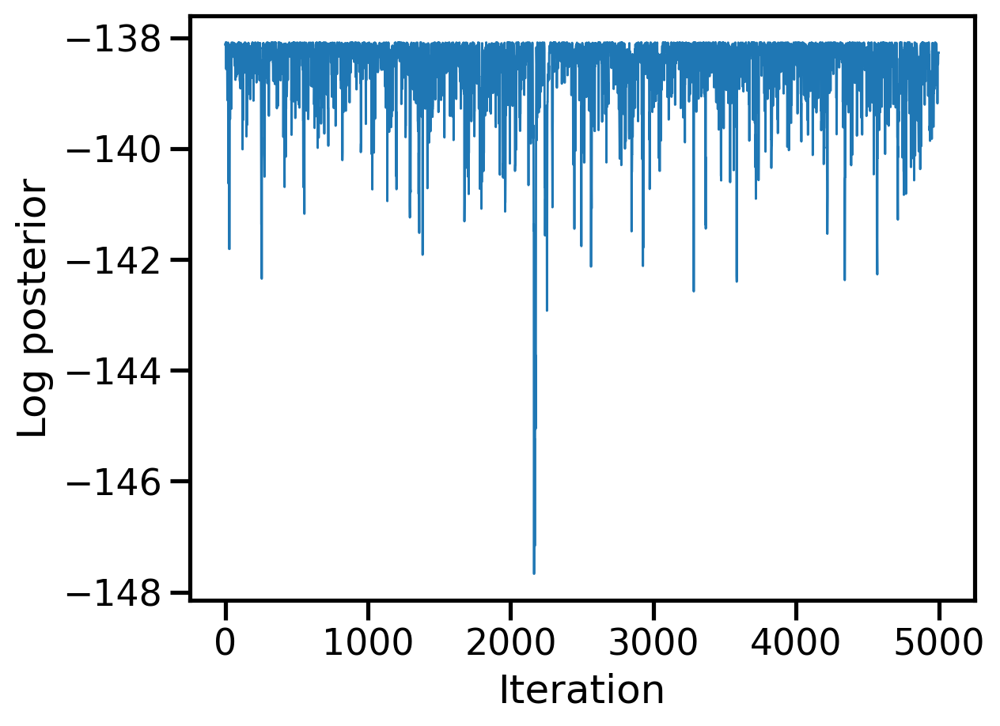

In [61]:
plt.plot(logposteriors[burnin:], lw=1)
plt.xlabel('Iteration')
plt.ylabel('Log posterior');

Let's take the mean of the post-burnin samples as our MAP estimate.

That makes sense if the posterior is symmetric and unimodal - we can check that.

μ = 10 
μ_hat = 10.2269 +/- 0.4416


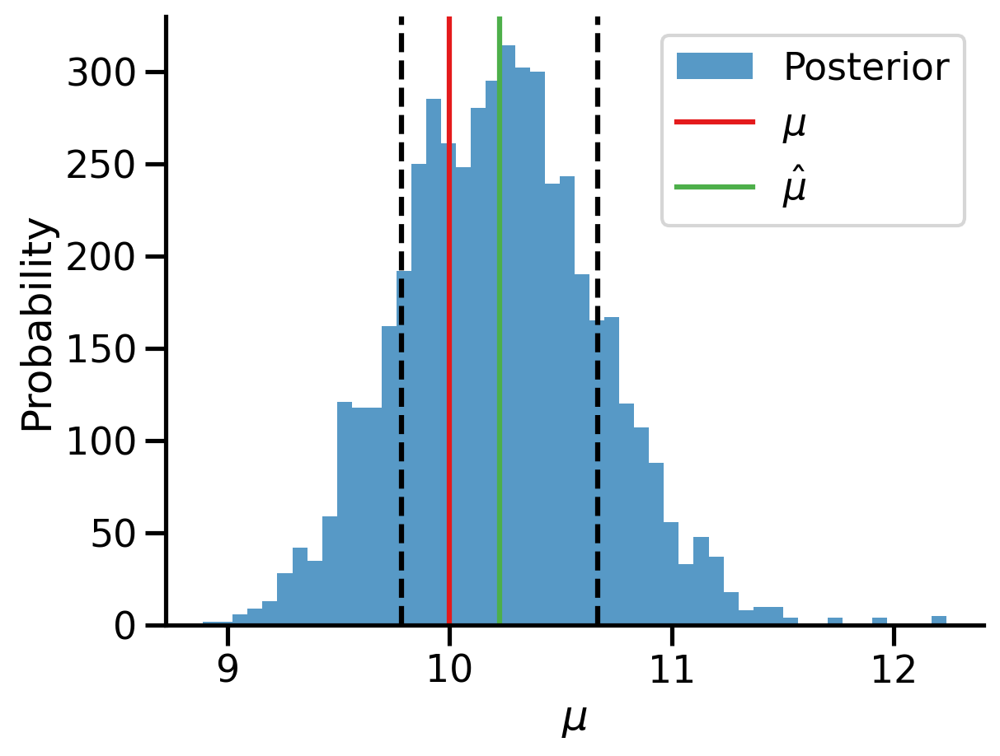

In [62]:
μ_hat = μ_samples.mean()
σ_hat = μ_samples.std()

print("μ = {} \nμ_hat = {:.4f} +/- {:.4f}".format(
    μ, μ_hat, σ_hat))

plt.hist(μ_samples, bins=50, alpha=0.75, label='Posterior')
plt.axvline(μ, color=red, label=r'$\mu$')
plt.axvline(μ_hat, color=green, label=r'$\hat{\mu}$')
plt.axvline(μ_hat+σ_hat, color='k', ls='--')
plt.axvline(μ_hat-σ_hat, color='k', ls='--')

plt.xlabel("$\mu$")
plt.ylabel("Probability")
plt.legend()
sns.despine()

Other interesting diagnostics we can do are to look at the differences between consecutive samples.
Their distribution should match the proposal distribution $N(0, \eta)$, ploted below as a black line.

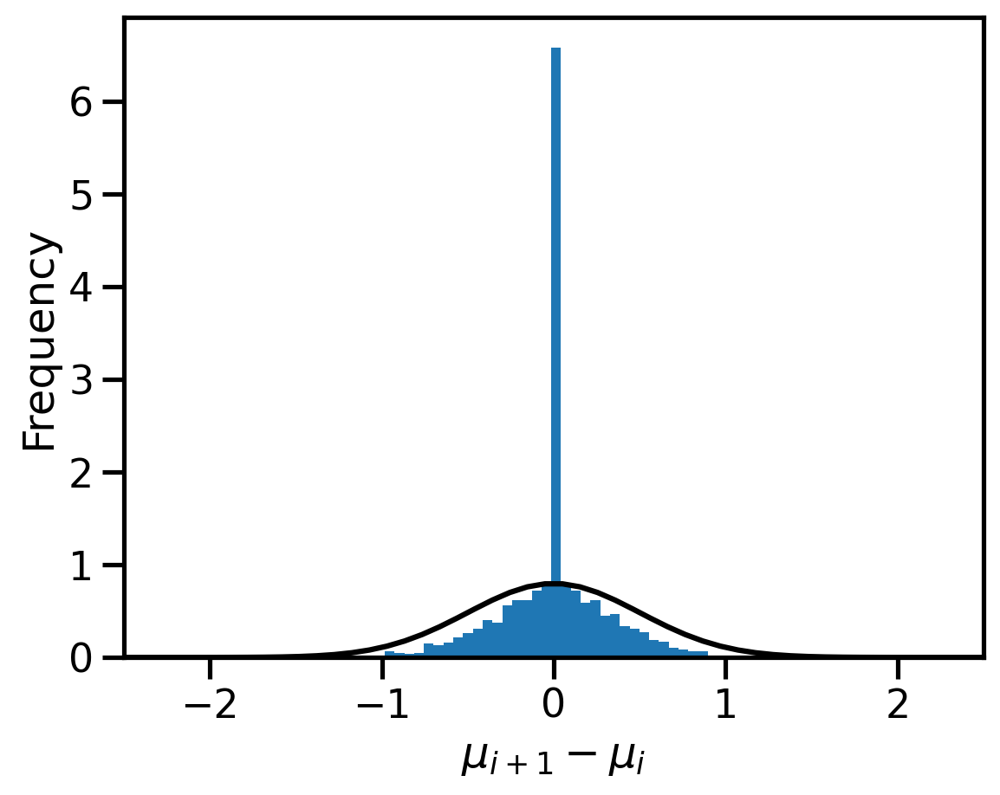

In [63]:
diff = μ_samples[1:] - μ_samples[:-1]
plt.hist(diff, bins=50, density=True)
diff_range = np.linspace(-η*5, η*5)
plt.plot(diff_range, scipy.stats.norm.pdf(diff_range, 0, η), color='k')
plt.xlim(-η*5, η*5)
plt.xlabel(r'$\mu_{i+1}-\mu_i$')
plt.ylabel('Frequency');

This is important because it means that our samples are correlated. We want to make sure that they are weakly correlated -- that the correlation is lost after a few iterations

We can check the [autocorrelation](https://en.wikipedia.org/wiki/Autocorrelation), which is a measure of how much sample $i$ is correlated with sample $i+k$ (with lag $k$). We want to check that the correlation quickly goes down with $k$.

We can see that here that is the case and that the autocorrelation goes down with the lag $k$.

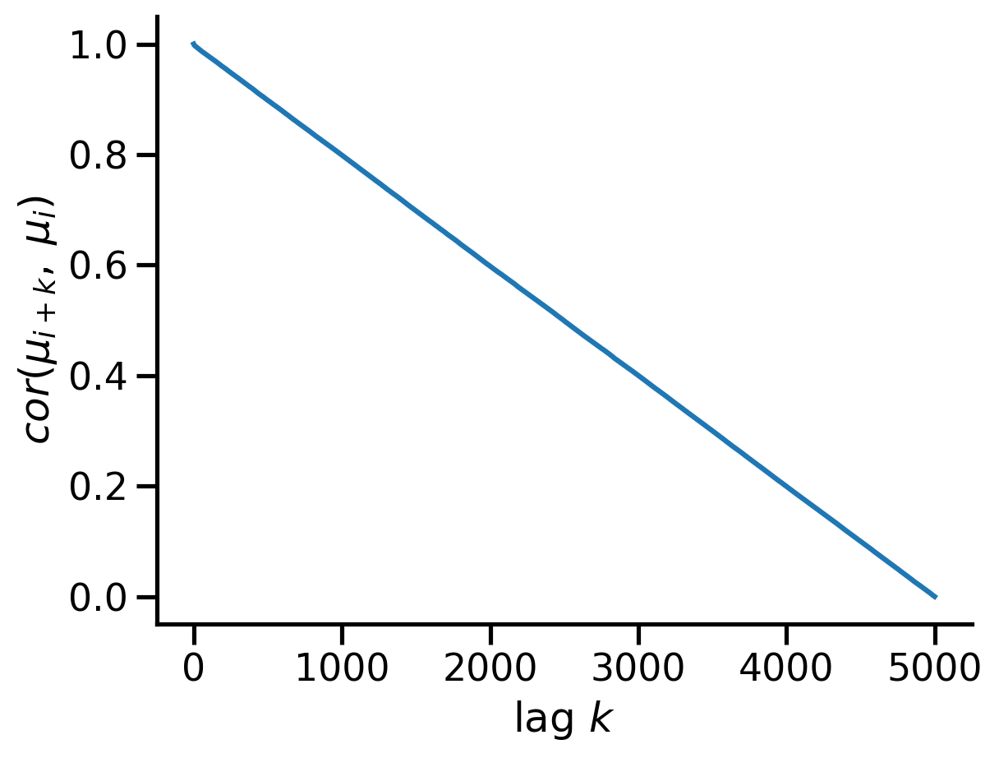

In [64]:
autocorr = np.correlate(μ_samples, μ_samples, mode='full')
autocorr /= autocorr.max()
autocorr = autocorr[autocorr.size // 2 :]

plt.plot(autocorr)
plt.xlabel('lag $k$')
plt.ylabel('$cor(\mu_{i+k}, \; \mu_i)$')
sns.despine()

## emcee: The MCMC Hammer

Now that we understand how sampling could work, we will use a more sophisticated an [affine-invariant ensemble sampler for Markov chain Monte Carlo (MCMC)](https://arxiv.org/abs/1202.3665): the [emcee](https://emcee.readthedocs.io/) library (`pip install emcee`).

To setup the sampler, we generate some random starting guesses for multiple chains of samples.

In [11]:
import emcee 

In [12]:
ndim = 1  # number of parameters in the model
nwalkers = 50  # number of MCMC walkers
nsteps = 10000 // nwalkers  # number of MCMC steps to take
nburn = nsteps // 2  # "burn-in" period to let chains stabilize

# we'll start at random locations between 0 and 2000
rng = np.random.default_rng(23892)
guesses = 20 * rng.random((nwalkers, ndim))

In [15]:
# avoid negative μ values
@np.vectorize(excluded=(1,))
def log_posterior_(μ, X):
    if μ < 0: 
        return -np.inf
    return log_posterior(μ, X)

sampler = emcee.EnsembleSampler(
    nwalkers=nwalkers, 
    ndim=ndim,
    log_prob_fn=log_posterior_,
    args=[X]
)
sampler.run_mcmc(
    initial_state=guesses,
    nsteps=nsteps
)

# sampler.chain.shape = (nwalkers, nsteps, ndim)
# discard burn-in points and flatten with ravel()
sample = sampler.chain[:, nburn:, :].ravel()

If this all worked correctly, the array `sample` should contain a series of 5,000 points drawn from the posterior. Let's plot them and check.

In [16]:
μ_hat = sample.mean()
std_hat = sample.std()

print("μ = {} \nμ_hat = {:.4f} +/- {:.4f}".format(
    μ, μ_hat, std_hat))

μ = 10 
μ_hat = 10.3305 +/- 0.4665


Before examining the posterior distribution, lets look at the trace plot, which shows the samples for each chain -- the $\mu$ sample values across sampling iterations; and the estimated posterior distributions for each chain.

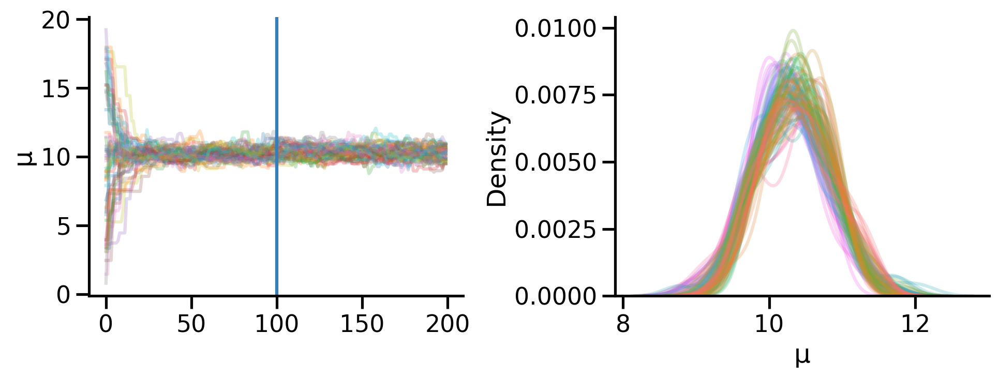

In [28]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].plot(sampler.chain[:,:,0].T, alpha=0.25);
axes[0].axvline(nburn, color=blue)
axes[0].set_ylabel('μ')

sns.kdeplot(sampler.chain[:, nburn:, 0], alpha=0.25, legend=False, ax=axes[1],)
axes[1].set_xlabel('μ')

fig.tight_layout()
sns.despine()

You can see here why we need to remove the initial `nburn` samples (or maybe less of them) and that the chains seem to have converged to the same posterior more or less.

Now we can plot the posterior distribution, together with the estimate (green) $\pm$ standard deviation (dashed black lines), the true value (red). We can see that the true value is within the one standard deviation of the estimate, which is pretty good.

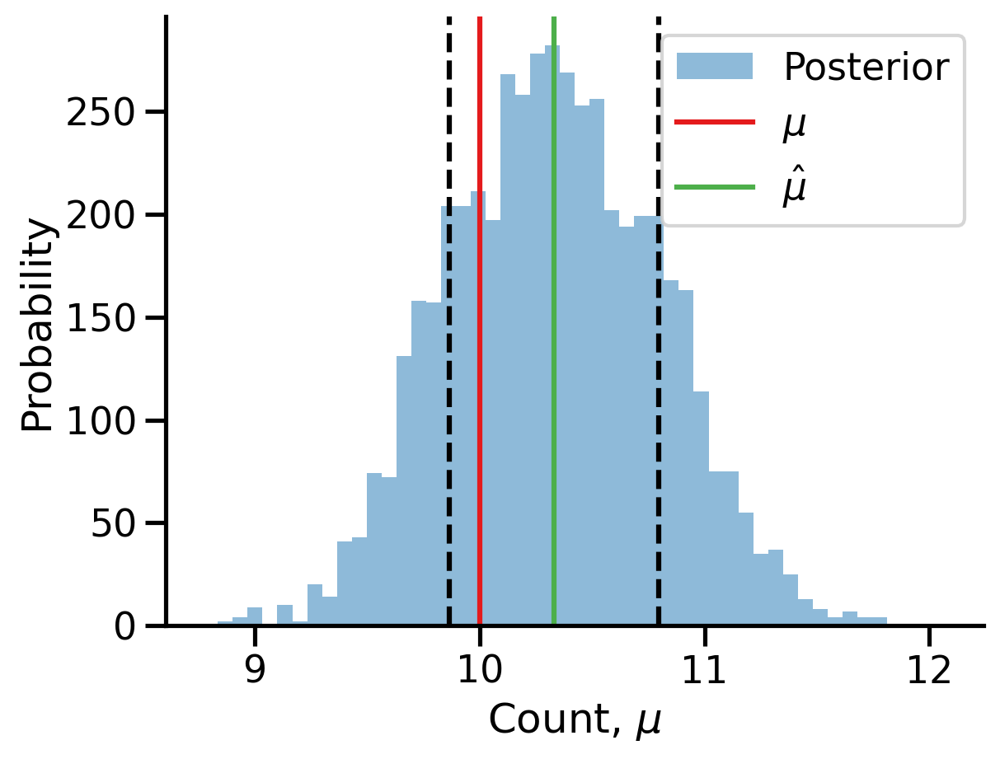

In [29]:
plt.hist(sample, bins=50, alpha=0.5, label='Posterior')
plt.axvline(μ, color=red, label=r'$\mu$')
plt.axvline(μ_hat, color=green, label=r'$\hat{\mu}$')
plt.axvline(μ_hat+std_hat, color='k', ls='--')
plt.axvline(μ_hat-std_hat, color='k', ls='--')

plt.xlabel("Count, $\mu$")
plt.ylabel("Probability")
plt.legend()
sns.despine()

For this simple problem, both approaches yield the same result, more or less.

## PyMC: probablistic programming in Python

[PyMC](http://pymc.io) is a Python library for probabilistic programming, which allows users to define, fit, and analyze Bayesian models using a variety of numerical methods. It is built on top of NumPy and other scientific libraries, and is designed to be easy to use and flexible, while providing advanced features such as Markov chain Monte Carlo (MCMC) sampling and variational inference. PyMC is open-source software and is widely used in a variety of fields, including machine learning, statistics, and bioinformatics.

[Arviz](http://arviz.org) provides tools for exploratory analysis of Bayesian models. It works well with PyMC, as well as other libraries.



In [5]:
import pymc as pm
import arviz as az
print("PyMC", pm.__version__, "Arviz", az.__version__)

PyMC 5.16.1 Arviz 0.18.0


Here we build the model and sample from the posterior using the default sampler, [NUTS](http://www.stat.columbia.edu/~gelman/research/published/nuts.pdf).

In [6]:
with pm.Model() as poisson_model:
    μ_ = pm.Normal('μ', mu=9, sigma=2)
    X_obs = pm.Poisson('X_obs', mu=μ_, observed=X)
    idata = pm.sample(draws=10000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [μ]


Output()

Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 53 seconds.


Here are the trace plot (on the right) and the posterior of each chain (on the left), to assess convergence. Looking good.

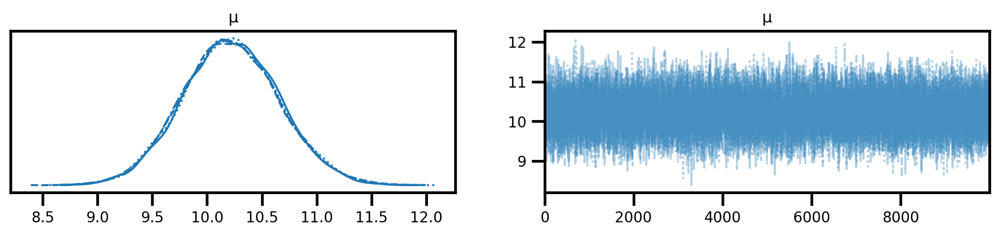

In [7]:
az.plot_trace(idata);

In [8]:
print('μ = {}'.format(μ))
isummary = az.summary(idata, round_to=2)
μ_hat = isummary.loc['μ', 'mean']
isummary

μ = 10


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
μ,10.22,0.44,9.37,11.03,0.0,0.0,17446.29,27713.01,1.0


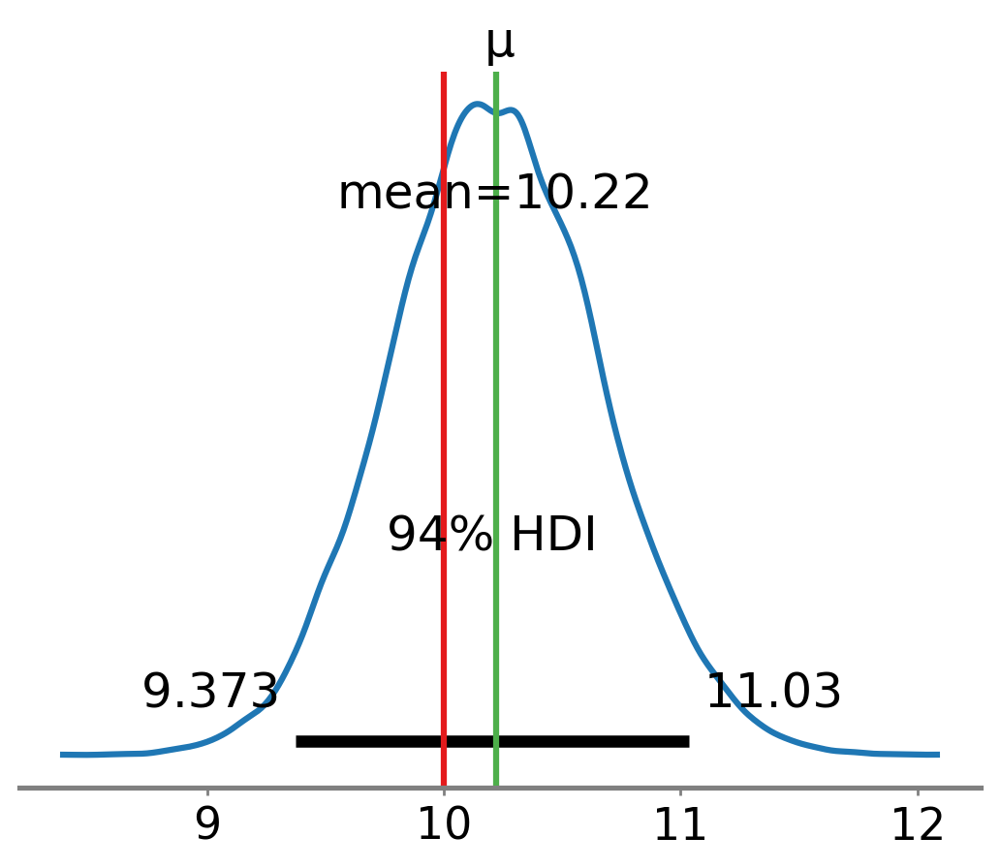

In [9]:
az.plot_posterior(idata, round_to=4)
plt.axvline(μ, color=red)
plt.axvline(μ_hat, color=green);

## Variational inference with ADVI

PyMC supports various [Variational Inference techniques](https://en.wikipedia.org/wiki/Variational_Bayesian_methods). While these methods are faster than samppling approaches, they are often also less accurate and can lead to biased inference. The main entry point is `pymc.fit()` (see [tutorial](https://www.pymc.io/projects/examples/en/latest/variational_inference/variational_api_quickstart.html)) with uses [Automatic Differentiation Variational Inference](https://arxiv.org/abs/1603.00788).

In [30]:
with poisson_model:
    approx = pm.fit(n=50000)

Output()

Finished [100%]: Average Loss = 138


The result here is *not* a sample from the posterior, but rather an [approximation](https://www.pymc.io/projects/docs/en/latest/api/generated/pymc.Approximation.html) of the posterior.

We can check for convergence by looking at the history of the loss function.

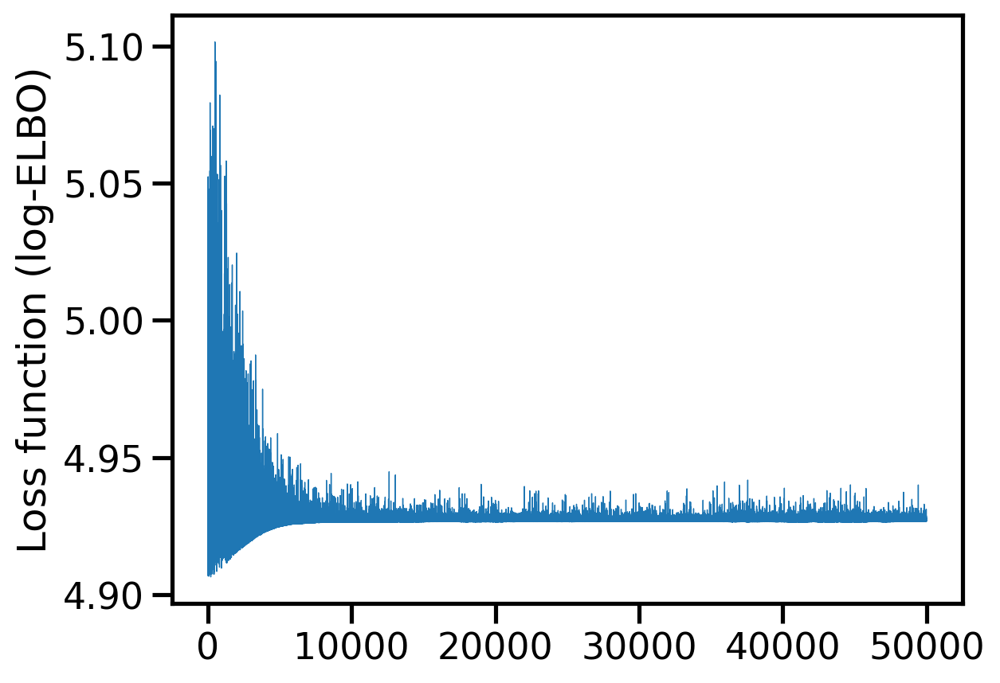

In [31]:
elbo = np.log(approx.hist)

plt.plot(elbo, lw=0.5)
plt.ylabel('Loss function (log-ELBO)');

It's very noisy so it's hard to say. Let's take a sliding average over it to smooth it a bit.
We also focus on the last 10,000 iterations of the fitting.

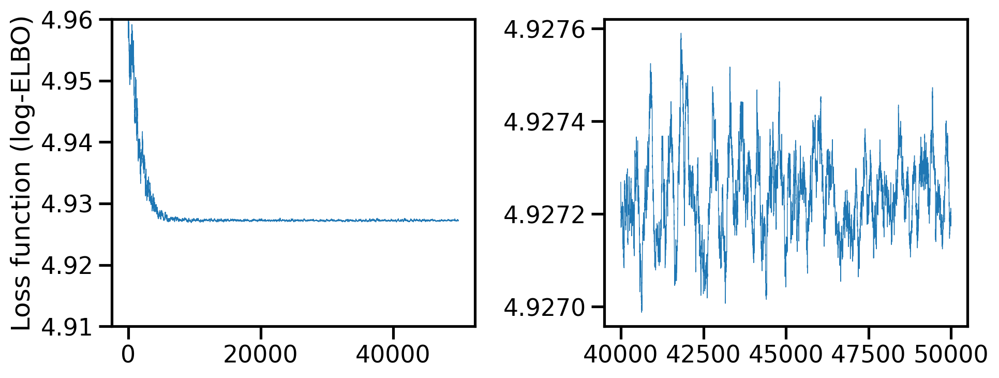

In [35]:
sliding_avg = np.lib.stride_tricks.sliding_window_view(elbo, 100).mean(axis=-1)

fig, axes = plt.subplots(1, 2, figsize=(10,4))
axes[0].plot(sliding_avg, lw=0.5)
axes[0].set_ylabel('Loss function (log-ELBO)')
axes[0].set_ylim(4.91, 4.96)

axes[1].plot(np.arange(elbo.size-10000, elbo.size), sliding_avg[-10000:], lw=0.5)
fig.tight_layout()

To examine the posterior distribution we now need to sample from the approximation, at which point we can use the returned `InferenceData` just as we did with the sampling approach.

arviz - WARNING - Shape validation failed: input_shape: (1, 5000), minimum_shape: (chains=2, draws=4)


μ = 10 
μ_hat = 10.23 +/- 0.47


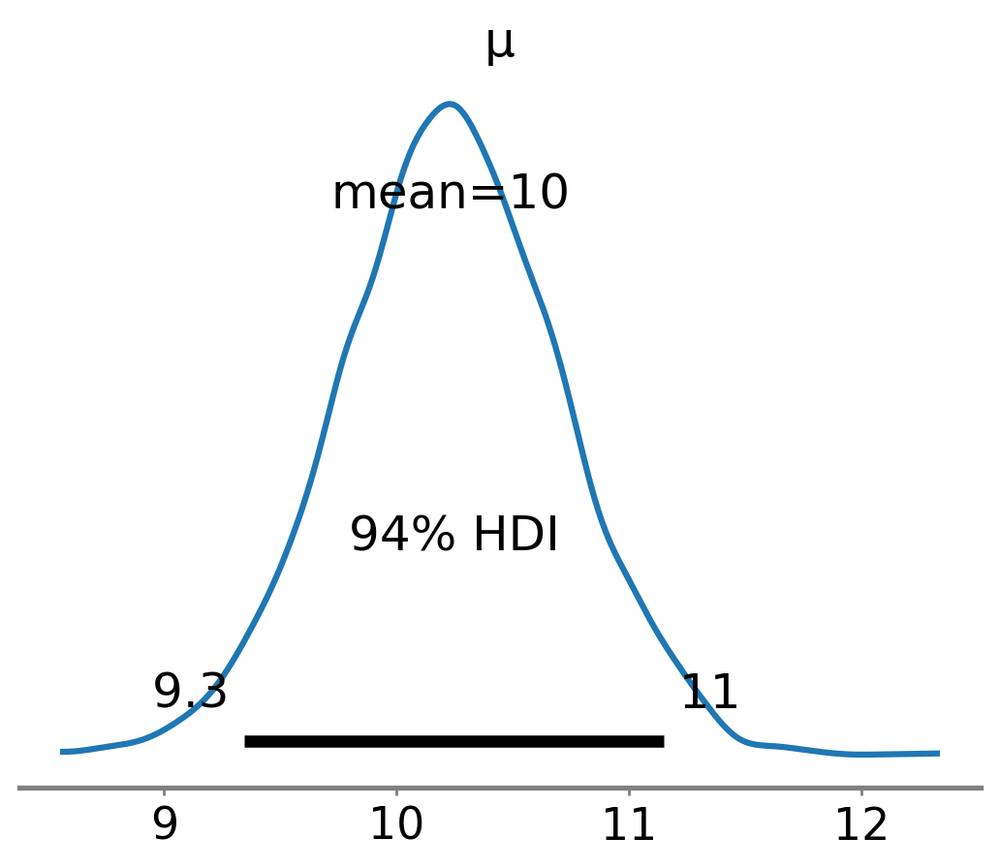

In [36]:
idata = approx.sample(5000)
az.plot_posterior(idata)
az.summary(idata)

μ_samples = idata.posterior["μ"].to_numpy()
μ_hat = μ_samples.mean()
μ_std = μ_samples.std()

print("μ = {} \nμ_hat = {:.2f} +/- {:.2f}".format(
    μ, μ_hat, μ_std))

We got similar results to the NUTS results.

# Over-dispersed Poisson model for count data

Here we assume that the measurements $\{X_i\}$ are still drawn from a Poisson distribution, but the expected values $\mu_i$ changes from leaf to leaf.
We assume it is drawn from a [Gamma distrubtion](https://en.wikipedia.org/wiki/Gamma_distribution#Related_distributions) with shape $r$ and scale $\phi$ ( with expected value $r\phi$ and variance $r\phi^2$):
$$
\mu_i \sim Gamma(r, \phi) $$$$
X_i \sim Poi(\mu_i)
$$

We note the model parameters as $\theta = (r, \phi)$.

Our data is still $\{X_i\}$, but the model is now _compound_, as it includes a model for the measurements $Poi(\mu_i)$ and a model for the Poisson parameter $Gamma(r, \phi)$.

## Synthetic data from over-dispersed Poisson model

Let's simulate data according to this compound model.

In [37]:
# for reproducibility
rng = np.random.default_rng(4222)
n = 150
θ = (r, ϕ) = 5, 2

μi = rng.gamma(r, scale=ϕ, size=n)
X = rng.poisson(μi)

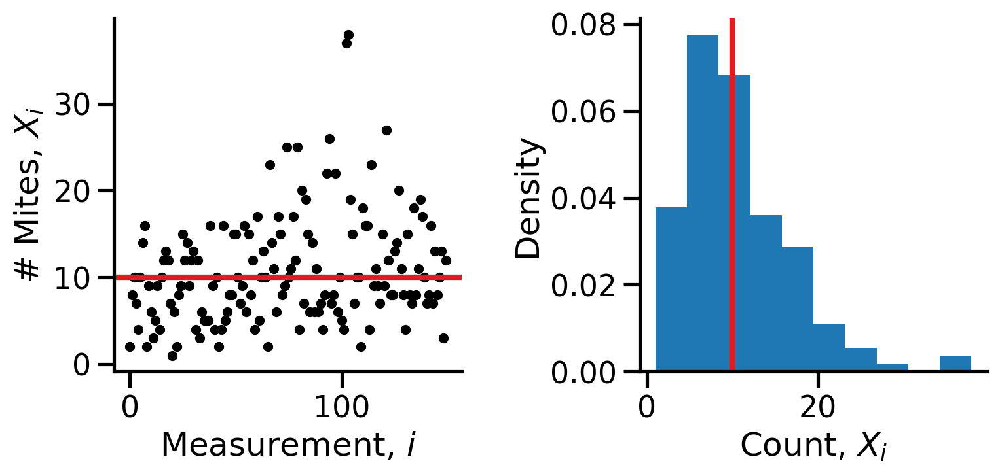

In [38]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

ax = axes[0]
ax.plot(np.arange(n), X, '.k')
ax.axhline(r*ϕ, linewidth=3, color=red)
ax.set_xlabel("Measurement, $i$")
ax.set_ylabel("# Mites, $X_i$")

ax = axes[1]
ax.hist(X, bins=10, density=True)
ax.axvline(r*ϕ, linewidth=3, alpha=1, color=red)
ax.set_ylabel("Density")
ax.set_xlabel("Count, $X_i$")

fig.tight_layout()
sns.despine()

Again, we have already written the log-likelihood function:

In [40]:
@np.vectorize(signature='(2)->()', excluded=(1,))
def log_likelihood(θ, X):
    r, ϕ = θ
    p = ϕ/(ϕ+1)
    return scipy.stats.nbinom(r, p).logpmf(X).sum()

log_likelihood(θ, X)

array(-1072.02392877)

We used SciPy's optimization routines to find the maximum likelihood (and then bootstrap to find confidence intervals).

In [41]:
def neg_log_likelihood(θ, X):
    return -log_likelihood(θ, X)

def mle(X, verbose=False, full_path=False):
    r_guess = X.mean()
    ϕ_guess = r_guess * r_guess / (X.var(ddof=1) - r_guess) # eq 3 in Bliss and Fisher 1953

    return scipy.optimize.fmin(
        func=neg_log_likelihood, # function to minimize with respect to first argument
        x0=(r_guess, ϕ_guess),  # initial guess
        args=(X,), # additional arguments to func
        disp=verbose, # no prints
        retall=full_path
    )

θ_hat = mle(X, verbose=True)
r_hat, ϕ_hat = θ_hat
print("r = {} \tr_hat = {:.4f}\nϕ = {}\tϕ_hat = {:.4f}".format(r, r_hat, ϕ, ϕ_hat))

Optimization terminated successfully.
         Current function value: 470.052515
         Iterations: 59
         Function evaluations: 115
r = 5 	r_hat = 4.4315
ϕ = 2	ϕ_hat = 0.4113


## Inference on synthetic data

This is very similar to the previous case, with minor modifications for the compound model.

We use uninformative priors:
$$
r \sim U(0, 10) $$$$
\phi \sim U(0, 5) 
$$

Note that here we need to sample a separate $\mu_i$ for each data point $i$, so we need to add a new "lead" dimension to the Poisson distribution. 
We do this by specifying a `coords` for the `Model` constructor, and then specifiying `dims=leaf` to the `Poisson` distribution.

In [42]:
with pm.Model(coords={'leaf':range(n)}) as gamma_poisson_model:
    r_ = pm.Uniform('r', lower=0, upper=10)
    ϕ_ = pm.Uniform('ϕ', lower=0, upper=5)
    μ_ = pm.Gamma('μ', alpha=r_, beta=1/ϕ_, dims='leaf')
    X_obs = pm.Poisson('X_obs', mu=μ_, observed=X)
    idata_gamma_poisson = pm.sample(draws=10000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [r, ϕ, μ]


Output()

Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 99 seconds.
There were 1 divergences after tuning. Increase `target_accept` or reparameterize.


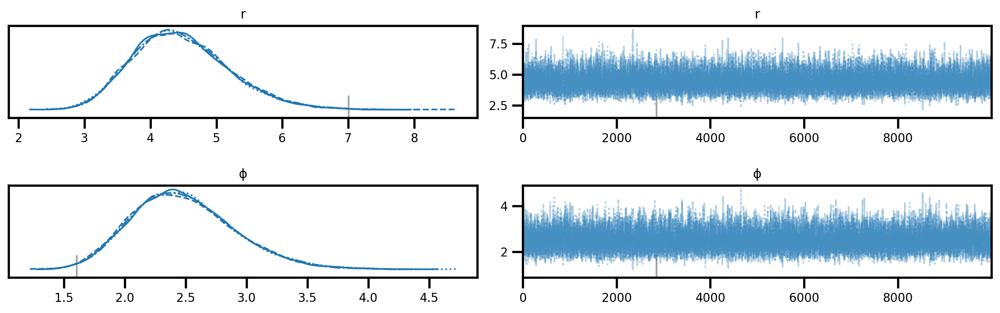

In [43]:
az.plot_trace(idata_gamma_poisson, var_names=['r', 'ϕ'])
plt.tight_layout()

In [44]:
print('r={}, ϕ={}'.format(r, ϕ))
isummary = az.summary(idata_gamma_poisson, var_names=['r', 'ϕ'], round_to=4)
r_hat = isummary.loc['r', 'mean']
ϕ_hat = isummary.loc['ϕ', 'mean']
isummary

r=5, ϕ=2


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
r,4.4711,0.7345,3.1608,5.8614,0.0073,0.0052,10316.3162,15461.3974,1.0003
ϕ,2.4836,0.4251,1.7154,3.2799,0.0041,0.0029,10587.5005,16682.1936,1.0003


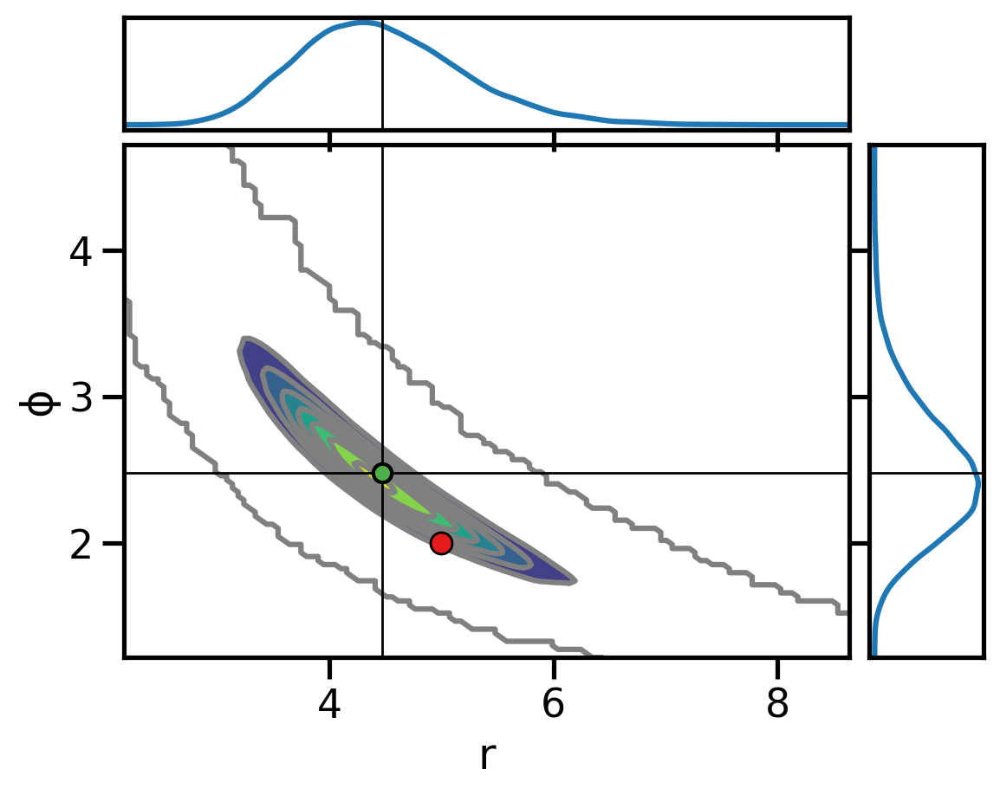

In [47]:
grid = az.plot_pair(idata_gamma_poisson, 
    kind='kde', var_names=['r', 'ϕ'],
    marginals=True, 
    point_estimate='mean', point_estimate_kwargs=dict(lw=1), 
    point_estimate_marker_kwargs=dict(color=green, marker='o', zorder=100, ec='k'),
    reference_values={'r':r, 'ϕ':ϕ}, reference_values_kwargs=dict(color=red), 
)

Let's look at the posteriors of the different $\mu$.

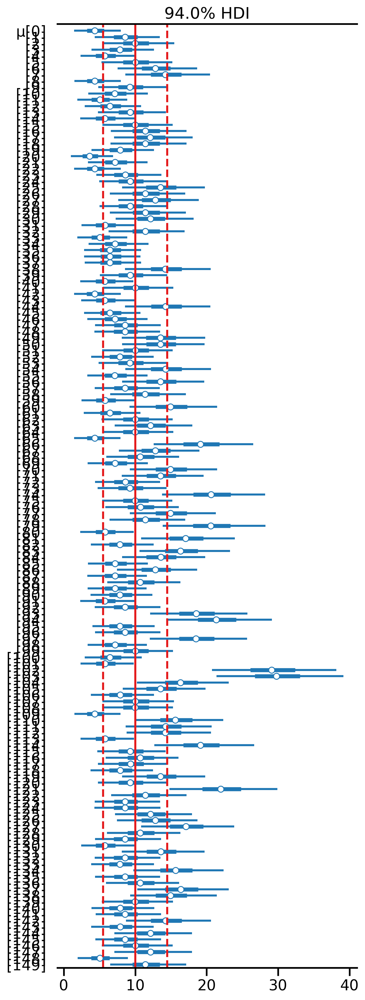

In [48]:
az.plot_forest(idata_gamma_poisson, var_names=['μ'], kind='forestplot', combined=True);
plt.axvline(r * ϕ, color=red);
plt.axvline(r * ϕ + (r * ϕ * ϕ)**0.5, color=red, ls='dashed');
plt.axvline(r * ϕ - (r * ϕ * ϕ)**0.5, color=red, ls='dashed');

## Inference on mites data

Let's try out this over-dispersed Poisson model on our real "mites on leaves" data.

We reload our data.

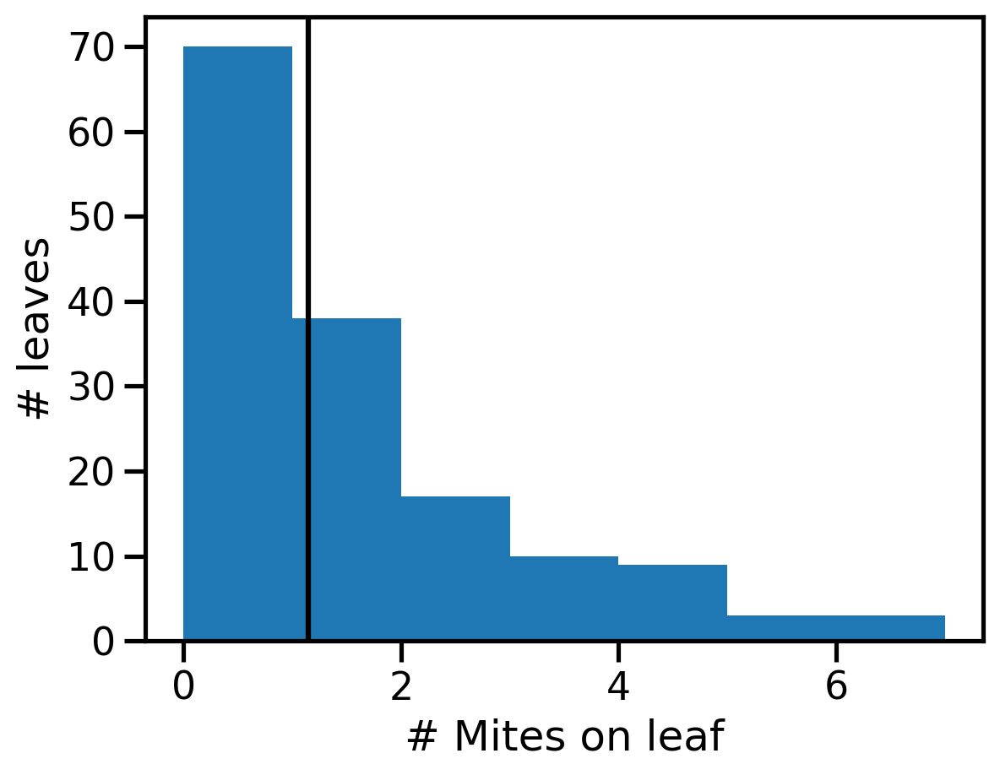

In [49]:
X = np.loadtxt('../data/mites.csv', delimiter=',')
plt.hist(X, range(8))
plt.axvline(X.mean(), color='k')
plt.xlabel('# Mites on leaf')
plt.ylabel('# leaves');

The MLE estimate was $\hat r \approx 1.02$ and $\hat \phi \approx 0.9$, so we can set the priors a bit narrower.

In [50]:
with pm.Model(coords={'leaf':range(n)}) as mites_model:
    r_ = pm.Uniform('r', lower=0, upper=3)
    ϕ_ = pm.Uniform('ϕ', lower=0, upper=2)
    μ_ = pm.Gamma('μ', alpha=r_, beta=1/ϕ_, dims='leaf')
    X_obs = pm.Poisson('X_obs', mu=μ_, observed=X)
    idata_mites = pm.sample(draws=50000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [r, ϕ, μ]


Output()

Sampling 4 chains for 1_000 tune and 50_000 draw iterations (4_000 + 200_000 draws total) took 363 seconds.
There were 564 divergences after tuning. Increase `target_accept` or reparameterize.


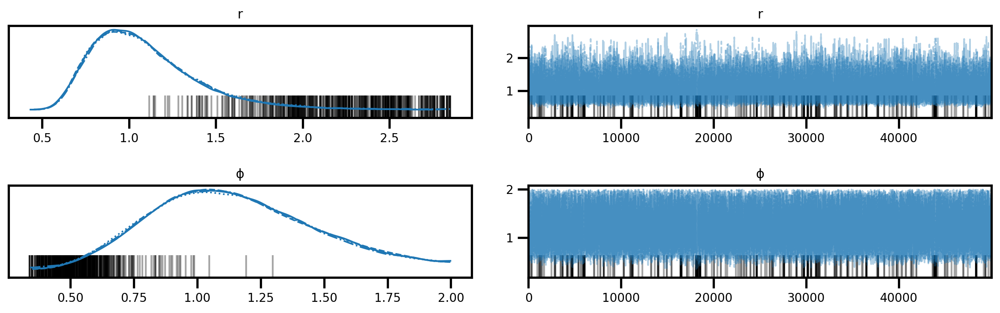

In [51]:
az.plot_trace(idata_mites, var_names=['r', 'ϕ'])
plt.tight_layout();

In [52]:
isummary = az.summary(idata_mites, var_names=['r', 'ϕ'], round_to=4)
isummary

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
r,1.0933,0.3133,0.6061,1.6784,0.0035,0.0028,10347.2769,10548.0664,1.0004
ϕ,1.1438,0.3168,0.5755,1.7584,0.0028,0.0019,11496.0089,11007.3606,1.0003


In [53]:
r_hat = isummary.loc['r', 'mean']
ϕ_hat = isummary.loc['ϕ', 'mean']

(0.5, 2.0)

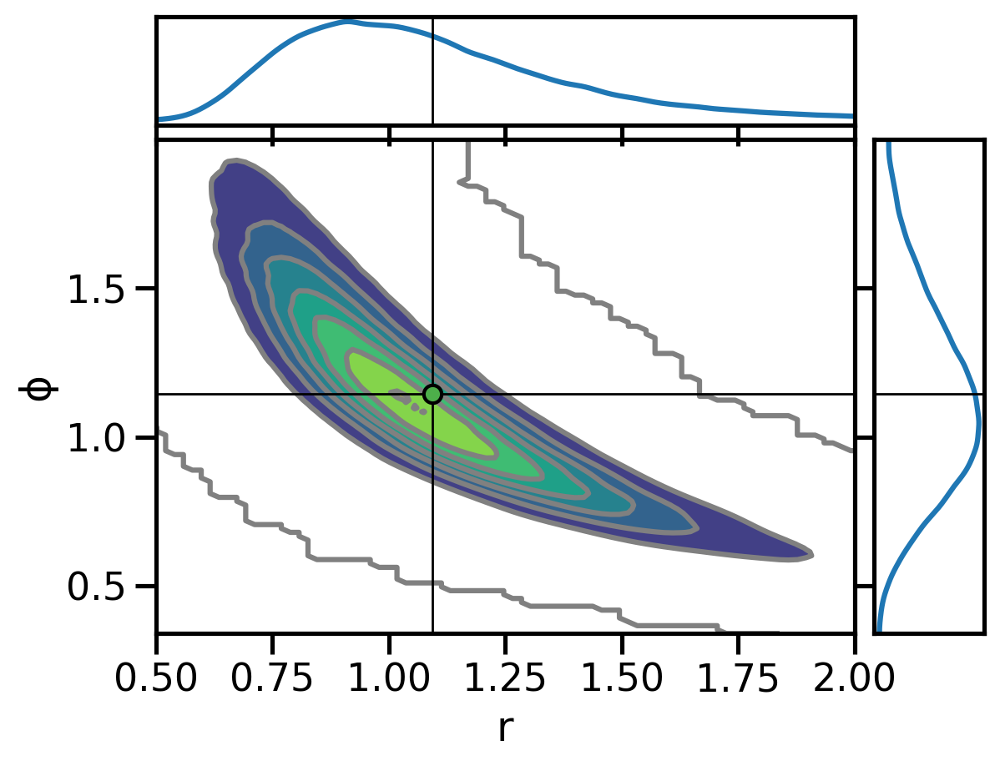

In [54]:
grid = az.plot_pair(idata_mites, 
    kind='kde', var_names=['r', 'ϕ'],
    marginals=True, 
    point_estimate='mean', point_estimate_kwargs=dict(lw=1), point_estimate_marker_kwargs=dict(color=green, marker='o', zorder=100, ec='k'),
)
grid[0,0].set_xlim(0.5, 2)

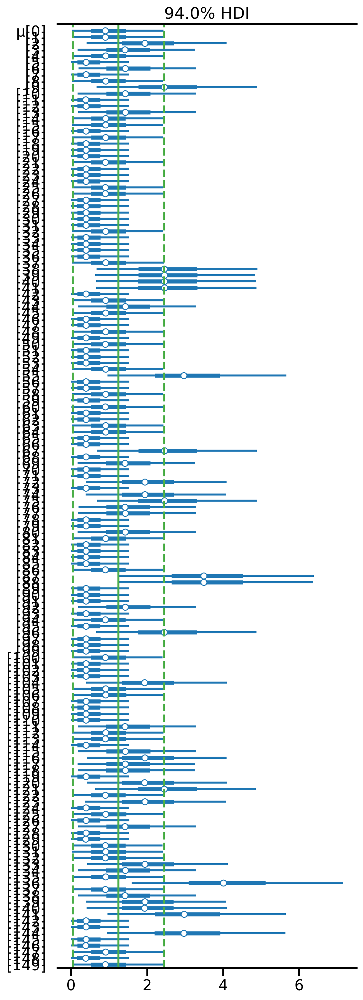

In [55]:
az.plot_forest(idata_mites, var_names=['μ'], kind='forestplot', combined=True);
plt.axvline(r_hat * ϕ_hat, color=green);
plt.axvline(r_hat * ϕ_hat + (r_hat * ϕ_hat * ϕ_hat)**0.5, color=green, ls='dashed');
plt.axvline(r_hat * ϕ_hat - (r_hat * ϕ_hat * ϕ_hat)**0.5, color=green, ls='dashed');

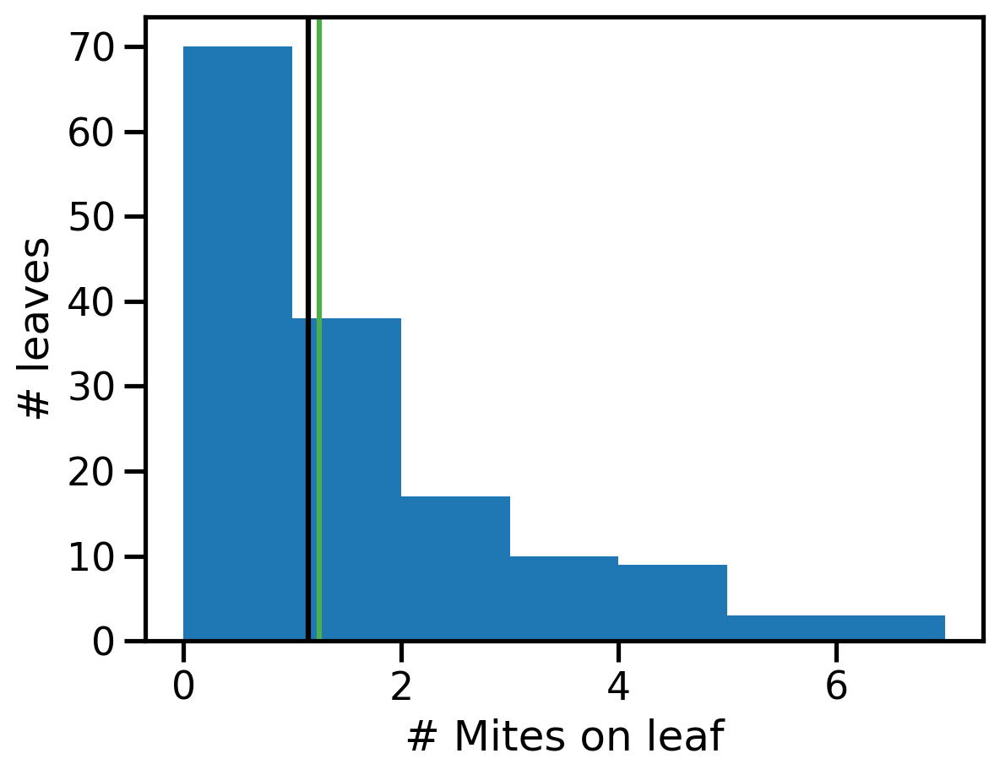

In [56]:
plt.hist(X, range(8))
plt.axvline(X.mean(), color='k')
plt.axvline(r_hat * ϕ_hat, color=green)
plt.xlabel('# Mites on leaf')
plt.ylabel('# leaves');

# References

- Jake VanDerPlas's series of [blog posts on Bayesian inference](http://jakevdp.github.io/blog/2014/03/11/frequentism-and-bayesianism-a-practical-intro/)
- Cam Davidson-Pilon's book [Bayesian Methods for Hackers](http://camdavidsonpilon.github.io/Probabilistic-Programming-and-Bayesian-Methods-for-Hackers/)
- [emcee](https://emcee.readthedocs.io/): the MCMC Hammer
- [PyMC](https://www.pymc.io): probabilistic programming for Python
- [corner](http://corner.readthedocs.io/): plotting joint and marginal density plots
- [ArviZ](https://arviz-devs.github.io/arviz): plotting MCMC results

# Colophon
This notebook was written by [Yoav Ram](http://www.yoavram.com) and is part of the [Models in Population Biology](http://modelspopbiol.yoavram.com) course at Tel Aviv University.

This work is licensed under a CC BY-NC-SA 4.0 International License.